# CHARGEMENT DES LIBRAIRIES

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sb 
from sklearn.preprocessing import StandardScaler, OneHotEncoder,LabelEncoder,OrdinalEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.compose import make_column_transformer
from sklearn.metrics import  confusion_matrix, classification_report
from sklearn.model_selection import GridSearchCV

import warnings 
warnings.filterwarnings('ignore')

#  1.CHARGEMENT DU DATASET

In [2]:
df=pd.read_csv("dataset.csv",sep=";",na_values="Unknown")

In [3]:
df

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,...,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,...,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [4]:
df.drop("CLIENTNUM",axis=1,inplace=True)

In [5]:
# conda install -c conda-forge dataprep dans l'environnement de python(installation)
from dataprep.eda import *

NumExpr defaulting to 8 threads.


DataPrep Report
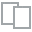
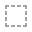
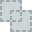
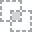
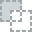
...
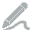
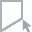
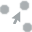
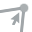
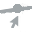

In [6]:
create_report(df)

In [23]:
report=create_report(df)

In [24]:
#creation d'un fichier sur le bureau html 

report.save(filename="analyse exploratoire", to="~/Desktop")


Report has been saved to C:\Users\Admin\Desktop/analyse exploratoire.html!


In [7]:
df.select_dtypes(include='object').columns

Index(['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category'],
      dtype='object')

In [15]:
var_quali = ['Gender', 'Education_Level', 'Marital_Status','Income_Category', 'Card_Category']

In [21]:
df_quali = pd.DataFrame(df, columns = var_quali)
x=df_quali
y=df['Attrition_Flag']

In [22]:
# from sklearn.feature_selection import SelectKBest, chi2
# chi2(x,y)

ValueError: could not convert string to float: 'M'

# 2.PRETRAITEMENT

- SUPPRESSION DES NA

In [ ]:
df.isna().sum()/len(df)*100

In [ ]:
df.dropna(axis=0,inplace=True)

In [ ]:
df.isna().sum().sum()

-  Encodage

In [ ]:
df.select_dtypes(include='object').columns

In [ ]:
y=df["Attrition_Flag"]

In [ ]:
y.replace({'Existing Customer':0,'Attrited Customer':1},inplace=True)
df.drop("Attrition_Flag",axis=1,inplace=True)

In [ ]:
y

In [ ]:
df_train,df_test,y_train,y_test = train_test_split(df,y,test_size=0.3,random_state=42)

In [ ]:
df_train

In [ ]:
df_train["Income_Category"].replace({"Less than $40K":0,"$40K - $60K":1,"$60K - $80K":2,"$80K - $120K":3,"$120K +":4},inplace=True)

In [ ]:
df_train["Card_Category"].replace({"Blue":0,"Silver":1,"Gold":2,"Platinum":3},inplace=True)
df_train["Education_Level"].replace({"Uneducated":0,"College":1,"High School":2,"Graduate":3,"Post-Graduate":4,"Doctorate":5},inplace=True)

In [ ]:
df_train

In [ ]:
def categorie_encoder(data,cat_feature):
    for col in cat_feature:
        dummy_data=pd.get_dummies(data[col], dummy_na=False, drop_first=True)
        data=data.drop(col, axis='columns')
        data=pd.concat([data,dummy_data], axis='columns')
    return data

In [ ]:
df_train=categorie_encoder(df_train,['Gender','Marital_Status'])
df_train

In [ ]:
df_test["Income_Category"].replace({"Less than $40K":0,"$40K - $60K":1,"$60K - $80K":2,"$80K - $120K":3,"$120K +":4},inplace=True)

In [ ]:
df_test["Card_Category"].replace({"Blue":0,"Silver":1,"Gold":2,"Platinum":3},inplace=True)
df_test["Education_Level"].replace({"Uneducated":0,"College":1,"High School":2,"Graduate":3,"Post-Graduate":4,"Doctorate":5},inplace=True)

In [ ]:
df_test=categorie_encoder(df_test,['Gender','Marital_Status'])
df_test

#  MODELISATION

- Regression Logistique

In [ ]:
logit = LogisticRegression()
model_logit=logit.fit(df_train, y_train)

In [ ]:
y_pred=model_logit.predict(df_test)

print(classification_report(y_test, y_pred))

-cross_validation

In [ ]:
from sklearn.model_selection import cross_val_score

In [ ]:
 cross_val_score(LogisticRegression(),df_train,y_train,cv=5,scoring='f1').mean()

In [ ]:
model_logit.score(df_test, y_test)

In [ ]:
from sklearn.model_selection import learning_curve

In [ ]:
N,train_score,val_score=learning_curve(logit,df_train,y_train,train_sizes=np.linspace(0.1,1.0,10),cv=5,scoring='recall')
plt.figure(figsize=(12,8))
plt.title('courbe de validation de la regression logistique')
plt.plot(N,train_score.mean(axis=1),label="train")
plt.plot(N,val_score.mean(axis=1),label="validation")
plt.xlabel('train_size')
plt.legend()
plt.show()


- Randomforest

In [ ]:
forest = RandomForestClassifier(n_estimators=100)

In [ ]:
model_forest=forest.fit(df_train,y_train)

In [ ]:
model_forest.score(df_test, y_test)

In [ ]:
y_pred=model_forest.predict(df_test)
print(classification_report(y_test, y_pred))

In [ ]:
N,train_score,val_score=learning_curve(forest,df_train,y_train,train_sizes=np.linspace(0.1,1.0,10),cv=5,scoring='recall')
plt.figure(figsize=(12,8))
plt.title('courbe de validation de la regression logistique')
plt.plot(N,train_score.mean(axis=1),label="train")
plt.plot(N,val_score.mean(axis=1),label="validation")
plt.xlabel('train_size')
plt.legend()
plt.show()

-  SVM

     1.Noyau lineaire

In [ ]:
classifier = SVC(kernel = 'linear', random_state= 42)
model_svm =classifier.fit(df_train, y_train)

In [ ]:
y_pred=model_svm.predict(df_test)
print(classification_report(y_test, y_pred))

     2.Noyau polynomial

In [ ]:
classifier = SVC(kernel = 'poly', random_state= 42)
model_svm =classifier.fit(df_train, y_train)

In [ ]:
y_pred=model_svm.predict(df_test)
print(classification_report(y_test, y_pred))

In [ ]:
classifier = SVC(kernel = 'rbf', random_state= 42)
model_svm =classifier.fit(df_train, y_train)

In [ ]:
y_pred=model_svm.predict(df_test)
print(classification_report(y_test, y_pred))

Le modele de randomforest semble plus performant